# **NYC Taxi Data Analysis**

The New York City Taxi and Limousine Commission (TLC), created in 1971, is the agency responsible for licensing and regulating New York City’s Medallion (Yellow) taxi cabs, for-hire vehicles (community-based liveries, black cars and luxury limousines), commuter vans, and paratransit vehicles. **Over 200,000 TLC licensees complete approximately 1,000,000 trips each day.** In New York City, the yellow taxis are an important iconic symbol that represents the city. However, NYC taxi market has deteriorated for the traditional yellow cabs since the Uber and other ridesharing applications introduced in the city. It is therefore important to understand their pickup patterns.

In [ ]:
%sh pip install graphframes

Requirement already satisfied: graphframes in /databricks/python3/lib/python3.7/site-packages (0.6)
Requirement already satisfied: numpy in /databricks/python3/lib/python3.7/site-packages (from graphframes) (1.18.1)
Requirement already satisfied: nose in /databricks/python3/lib/python3.7/site-packages (from graphframes) (1.3.7)
WARNING: You are using pip version 20.0.2; however, version 20.2.4 is available.
You should consider upgrading via the '/databricks/python3/bin/python3.7 -m pip install --upgrade pip' command.

In [ ]:
%sh pip install networkx

Requirement already satisfied: networkx in /databricks/python3/lib/python3.7/site-packages (2.5)
Requirement already satisfied: decorator>=4.3.0 in /databricks/python3/lib/python3.7/site-packages (from networkx) (4.4.1)
WARNING: You are using pip version 20.0.2; however, version 20.2.4 is available.
You should consider upgrading via the '/databricks/python3/bin/python3.7 -m pip install --upgrade pip' command.

In [ ]:
dbutils.library.installPyPI("folium")

Out[6]: True

### Mount Azure Blob Storage

We are using Azure Blob storage to store our data files for this project

### Import Libraries

In [ ]:
from pyspark.sql import *
from pyspark.sql.functions import *
from pyspark.sql.types import *

import folium
import pandas
import matplotlib.pyplot as plt
import seaborn as sns

from pyspark.ml.regression import LinearRegression
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, VectorAssembler
from pyspark.ml.feature import OneHotEncoder
from pyspark.ml.evaluation import RegressionEvaluator

import pyspark
from distutils.version import LooseVersion

from graphframes import *
import networkx as nx

### Schema for trip data

In [ ]:
ddl_schema = (StructType([
   StructField("VendorID", IntegerType(), False),
   StructField("tpep_pickup_datetime", TimestampType(), False),
   StructField("tpep_dropoff_datetime", TimestampType(), False),
   StructField("passenger_count", IntegerType(), False),
   StructField("trip_distance", FloatType(), False),
   StructField("RatecodeID", IntegerType(), False),
   StructField("store_and_fwd_flag", StringType(), False),
   StructField("PULocationID", IntegerType(), False),
   StructField("DOLocationID", IntegerType(), False),
   StructField("payment_type", IntegerType(), False),
   StructField("fare_amount", FloatType(), False),
   StructField("extra", FloatType(), False),
   StructField("mta_tax", FloatType(), False),
   StructField("tip_amount", FloatType(), False),
   StructField("tolls_amount", FloatType(), False),
   StructField("improvement_surcharge", FloatType(), False),
   StructField("total_amount", FloatType(), False),
   StructField("congestion_surcharge", FloatType(), False)]))

### Read taxi trip input files

In [ ]:
inputPath = "/mnt/nehadave/yellow_tripdata_2019-*.csv"  
staticInputDF = (
     spark
    .read
    .schema(ddl_schema)
    .csv(inputPath, header = True)
)

display(staticInputDF)

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
1,2019-01-01T00:46:40.000+0000,2019-01-01T00:53:20.000+0000,1,1.5,1,N,151,239,1,7.0,0.5,0.5,1.65,0.0,0.3,9.95,null
1,2019-01-01T00:59:47.000+0000,2019-01-01T01:18:59.000+0000,1,2.6,1,N,239,246,1,14.0,0.5,0.5,1.0,0.0,0.3,16.3,null
2,2018-12-21T13:48:30.000+0000,2018-12-21T13:52:40.000+0000,3,0.0,1,N,236,236,1,4.5,0.5,0.5,0.0,0.0,0.3,5.8,null
2,2018-11-28T15:52:25.000+0000,2018-11-28T15:55:45.000+0000,5,0.0,1,N,193,193,2,3.5,0.5,0.5,0.0,0.0,0.3,7.55,null
2,2018-11-28T15:56:57.000+0000,2018-11-28T15:58:33.000+0000,5,0.0,2,N,193,193,2,52.0,0.0,0.5,0.0,0.0,0.3,55.55,null
2,2018-11-28T16:25:49.000+0000,2018-11-28T16:28:26.000+0000,5,0.0,1,N,193,193,2,3.5,0.5,0.5,0.0,5.76,0.3,13.31,null
2,2018-11-28T16:29:37.000+0000,2018-11-28T16:33:43.000+0000,5,0.0,2,N,193,193,2,52.0,0.0,0.5,0.0,0.0,0.3,55.55,null
1,2019-01-01T00:21:28.000+0000,2019-01-01T00:28:37.000+0000,1,1.3,1,N,163,229,1,6.5,0.5,0.5,1.25,0.0,0.3,9.05,null
1,2019-01-01T00:32:01.000+0000,2019-01-01T00:45:39.000+0000,1,3.7,1,N,229,7,1,13.5,0.5,0.5,3.7,0.0,0.3,18.5,null
1,2019-01-01T00:57:32.000+0000,2019-01-01T01:09:32.000+0000,2,2.1,1,N,141,234,1,10.0,0.5,0.5,1.7,0.0,0.3,13.0,null


### Check taxi trip data columns

In [ ]:
staticInputDF.columns

Out[9]: ['VendorID',
 'tpep_pickup_datetime',
 'tpep_dropoff_datetime',
 'passenger_count',
 'trip_distance',
 'RatecodeID',
 'store_and_fwd_flag',
 'PULocationID',
 'DOLocationID',
 'payment_type',
 'fare_amount',
 'extra',
 'mta_tax',
 'tip_amount',
 'tolls_amount',
 'improvement_surcharge',
 'total_amount',
 'congestion_surcharge']

'VendorID' is a code indicating the TPEP provider that provided the record.


        1= Creative Mobile Technologies, LLC; 


        2= VeriFone Inc.
  
  
'tpep_pickup_datetime' is the date and time when the meter was engaged.


'tpep_dropoff_datetime' is the date and time when the meter was disengaged. 


'Passenger_count' is the number of passengers in the vehicle. This is a driver-entered value. 


'Trip_distance' is he elapsed trip distance in miles reported by the taximeter. 


'PULocationID' is the TLC Taxi Zone in which the taximeter was engaged 


'DOLocationID' is the TLC Taxi Zone in which the taximeter was disengaged 


'RateCodeID' is the final rate code in effect at the end of the trip. 


        1= Standard rate 


        2=JFK 


        3=Newark 


        4=Nassau or Westchester 


        5=Negotiated fare 


        6=Group ride 
  
  
'Store_and_fwd_flag' is the flag that indicates whether the trip record was held in vehicle memory before sending to the vendor, aka “store and forward,” because the vehicle did not have a connection to the server. 


          Y= store and forward trip 


          N= not a store and forward trip 
  
  
  
  
'Payment_type' is a numeric code signifying how the passenger paid for the trip. 


        1= Credit card 


        2= Cash 


        3= No charge 


        4= Dispute 


        5= Unknown 


        6= Voided trip 


'Fare_amount' is the time-and-distance fare calculated by the meter. Extra Miscellaneous extras and surcharges. Currently, this only includes the $0.50 and $1 rush hour and overnight charges. 


'MTA' tax that is automatically triggered based on the metered rate in use. 


'Improvement_surcharge' $0.30 improvement surcharge assessed trips at the flag drop.


'Tip_amount' is automatically populated for credit card tips. Cash tips are not included. 


'Tolls_amount' is total amount of all tolls paid in trip. 


'Total_amount' is the total amount charged to passengers. Does not include cash tips.

### Check Schema for Taxi Trip data

In [ ]:
staticInputDF.printSchema()

root
-- VendorID: integer (nullable = true)
-- tpep_pickup_datetime: timestamp (nullable = true)
-- tpep_dropoff_datetime: timestamp (nullable = true)
-- passenger_count: integer (nullable = true)
-- trip_distance: float (nullable = true)
-- RatecodeID: integer (nullable = true)
-- store_and_fwd_flag: string (nullable = true)
-- PULocationID: integer (nullable = true)
-- DOLocationID: integer (nullable = true)
-- payment_type: integer (nullable = true)
-- fare_amount: float (nullable = true)
-- extra: float (nullable = true)
-- mta_tax: float (nullable = true)
-- tip_amount: float (nullable = true)
-- tolls_amount: float (nullable = true)
-- improvement_surcharge: float (nullable = true)
-- total_amount: float (nullable = true)
-- congestion_surcharge: float (nullable = true)

### Total record count for Taxi trip data

In [ ]:
staticInputDF.count()

Out[13]: 84399019

We have a total of ~84M trip records from the year 2019

### Schema for Taxi Zone Lookup data

In [ ]:
taxi_schema = (StructType([
   StructField("LocationID", IntegerType(), False),
   StructField("Borough", StringType(), False),
   StructField("Zone", StringType(), False),
   StructField("service_zone", StringType(), False)]))

### Read taxi zone lookup file

In [ ]:
taxi_zones = spark.read.csv('dbfs:/mnt/nehagdave/taxi+_zone_lookup.csv', header=True, schema = taxi_schema)
display(taxi_zones)

LocationID,Borough,Zone,service_zone
1,EWR,Newark Airport,EWR
2,Queens,Jamaica Bay,Boro Zone
3,Bronx,Allerton/Pelham Gardens,Boro Zone
4,Manhattan,Alphabet City,Yellow Zone
5,Staten Island,Arden Heights,Boro Zone
6,Staten Island,Arrochar/Fort Wadsworth,Boro Zone
7,Queens,Astoria,Boro Zone
8,Queens,Astoria Park,Boro Zone
9,Queens,Auburndale,Boro Zone
10,Queens,Baisley Park,Boro Zone


### Check schema for taxi zone lookup table

In [ ]:
taxi_zones.printSchema()

root
-- LocationID: integer (nullable = true)
-- Borough: string (nullable = true)
-- Zone: string (nullable = true)
-- service_zone: string (nullable = true)

In [ ]:
taxi_zones.columns

Out[17]: ['LocationID', 'Borough', 'Zone', 'service_zone']

'LocationID' is the ID respresenting the location

'Borough' is the borough associated with the trip

'Zone' is the zone name ssociated with the trip

'service_zone' is the overall service zone of the trip

### Check record count for taxi zone lookup table

In [ ]:
taxi_zones.count()

Out[27]: 265

Taxi zone lookup contains 265 entries

###Filter out unknown boroughs

In [ ]:
taxi_zones = taxi_zones.filter(taxi_zones.Borough != 'Unknown')

In [ ]:
taxi_zones.count()

Out[29]: 263

After filtering out unknown boroughs we have 263 zones

In [ ]:
taxi_zones.cache()

Out[14]: DataFrame[LocationID: int, Borough: string, Zone: string, service_zone: string]

# Data Quality Check

#### Potentially erroneous total_amount

In [ ]:
display(staticInputDF.select("total_amount").describe())

summary,total_amount
count,84399019
mean,19.124363135655383
stddev,184.08735981679052
min,-1871.8
max,1084772.1


In [ ]:
display(staticInputDF.filter(staticInputDF.total_amount < 0).collect())

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
2,2019-01-01T00:32:56.000+0000,2019-01-01T00:33:35.000+0000,2,0.10000000149011612,1,N,148,148,3,-2.5,-0.5,-0.5,0.0,0.0,-0.30000001192092896,-3.799999952316284,null
2,2019-01-01T00:14:18.000+0000,2019-01-01T00:40:55.000+0000,1,4.130000114440918,1,N,170,238,4,-19.0,-0.5,-0.5,0.0,0.0,-0.30000001192092896,-20.299999237060547,null
2,2019-01-01T00:31:27.000+0000,2019-01-01T00:42:39.000+0000,1,1.350000023841858,1,N,162,234,4,-8.5,-0.5,-0.5,0.0,0.0,-0.30000001192092896,-9.800000190734863,null
2,2019-01-01T00:45:57.000+0000,2019-01-01T00:46:07.000+0000,1,0.0,1,N,234,234,4,-2.5,-0.5,-0.5,0.0,0.0,-0.30000001192092896,-3.799999952316284,null
2,2019-01-01T00:48:35.000+0000,2019-01-01T00:49:59.000+0000,1,0.1599999964237213,1,N,234,234,4,-3.0,-0.5,-0.5,0.0,0.0,-0.30000001192092896,-4.300000190734863,null
2,2019-01-01T00:22:13.000+0000,2019-01-01T00:26:40.000+0000,4,0.41999998688697815,1,N,234,113,3,-4.5,-0.5,-0.5,0.0,0.0,-0.30000001192092896,-5.800000190734863,null
2,2019-01-01T00:43:40.000+0000,2019-01-01T00:51:51.000+0000,5,0.4699999988079071,3,N,161,163,3,-24.0,-0.5,0.0,0.0,0.0,-0.30000001192092896,-24.799999237060547,null
2,2019-01-01T00:22:39.000+0000,2019-01-01T00:27:20.000+0000,1,0.699999988079071,2,N,142,142,2,-52.0,0.0,-0.5,0.0,0.0,-0.30000001192092896,-52.79999923706055,null
2,2019-01-01T00:10:25.000+0000,2019-01-01T00:13:38.000+0000,2,0.4000000059604645,1,N,42,41,4,-4.0,-0.5,-0.5,0.0,0.0,-0.30000001192092896,-5.300000190734863,null
2,2019-01-01T00:55:49.000+0000,2019-01-01T01:30:04.000+0000,1,15.130000114440918,1,N,79,184,2,-43.5,-0.5,-0.5,0.0,0.0,-0.30000001192092896,-44.79999923706055,null


In [ ]:
staticInputDF.filter(staticInputDF.total_amount < 0).count()

Out[32]: 169779

*There are some instances where the total_amount is less than 0. This does not make a lot of sense given the data set, and seems to likely be caused by erroneous data entry.*

#### Unreasonable Trip Distance

In [ ]:
display(staticInputDF.select("trip_distance").describe())

summary,trip_distance
count,84399019
mean,3.000927721068856
stddev,8.09111377689441
min,-37264.53
max,45977.22


In [ ]:
display(staticInputDF.filter(staticInputDF.trip_distance < 0).collect())

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
2,2019-11-20T16:51:31.000+0000,2019-11-20T17:51:56.000+0000,1,-11.449999809265137,5,N,45,74,2,39.59000015258789,0.0,0.0,0.0,0.0,0.0,39.59000015258789,0.0
2,2019-11-20T16:13:00.000+0000,2019-11-20T16:38:15.000+0000,1,-4.690000057220459,5,N,155,35,2,47.79999923706055,0.0,0.5,0.0,0.0,0.30000001192092896,48.599998474121094,0.0
2,2019-11-20T17:06:09.000+0000,2019-11-20T18:37:19.000+0000,1,-14.420000076293945,5,N,79,215,1,50.15999984741211,0.0,0.0,0.0,0.0,0.0,50.15999984741211,0.0
2,2019-11-21T05:12:22.000+0000,2019-11-21T05:45:49.000+0000,1,-8.550000190734863,5,N,21,170,2,40.380001068115234,0.0,0.0,0.0,6.119999885559082,0.0,46.5,0.0
2,2019-11-21T14:32:08.000+0000,2019-11-21T14:34:45.000+0000,1,-0.7599999904632568,5,N,125,249,2,10.5,0.0,0.5,0.0,0.0,0.30000001192092896,11.300000190734863,0.0
2,2019-11-21T19:16:58.000+0000,2019-11-21T19:23:59.000+0000,1,-1.1699999570846558,5,N,148,209,2,13.0,0.0,0.5,0.0,0.0,0.30000001192092896,13.800000190734863,0.0
2,2019-11-21T21:09:29.000+0000,2019-11-21T21:55:25.000+0000,1,-21.299999237060547,5,N,238,210,2,49.70000076293945,0.0,0.5,0.0,6.119999885559082,0.30000001192092896,56.619998931884766,0.0
2,2019-11-22T13:20:37.000+0000,2019-11-22T13:31:56.000+0000,1,-0.7699999809265137,5,N,113,234,2,27.200000762939453,0.0,0.5,0.0,0.0,0.30000001192092896,28.0,0.0
2,2019-11-22T13:06:21.000+0000,2019-11-22T13:56:19.000+0000,1,-9.25,5,N,261,76,2,58.68000030517578,0.0,0.5,0.0,0.0,0.30000001192092896,59.47999954223633,0.0
2,2019-11-24T10:59:01.000+0000,2019-11-24T11:13:24.000+0000,1,-0.07000000029802322,5,N,4,137,2,31.420000076293945,0.0,0.0,0.0,0.0,0.0,31.420000076293945,0.0


In [ ]:
staticInputDF.filter(staticInputDF.trip_distance < 0).count()

Out[40]: 9102

*There are records where the trip_distance is 0 miles. The 0 miles travelled may be due to cancelled trips or errorneous entries.*

#### Erroneous passenger_count

In [ ]:
display(staticInputDF.select("passenger_count").describe())

summary,passenger_count
count,84152418
mean,1.5626939442191667
stddev,1.2079174256677638
min,0
max,9


*There are records where the passenger_count values equal to 0 or greater. Since this value is entered by taxi drivers, the 0s may be instances where the driver did not enter any value.*

#### Incomplete dataset/erroneous dates

In [ ]:
min_date, max_date = staticInputDF.select(min("tpep_pickup_datetime"), max("tpep_pickup_datetime")).first()
min_date, max_date

Out[42]: (datetime.datetime(2001, 1, 1, 0, 2, 8),
 datetime.datetime(2090, 12, 31, 6, 41, 26))

*The data seems to contain erroneous data. There seems to be quite a bit of trips from the past (e.g. 2001), and trips from the future (e.g. 2090).*

#### Trips with unknown Vendors

In [ ]:
staticInputDF.where(col('VendorID').isNull()).count()

Out[43]: 246601

In [ ]:
staticInputDF.registerTempTable("static_table")

### Filtering Out Problematic Data

By doing the data quality check we came across some errorneous trip records. Hence we will now filter out the problematic data

In [ ]:
query = """
SELECT
    *
FROM
    static_table st
WHERE
    st.total_amount < 10000
    AND st.total_amount > 0
    AND st.trip_distance < 1000
    AND st.passenger_count < 100
    AND st.tpep_pickup_datetime >= '2019-01-01'
    AND st.tpep_pickup_datetime < '2019-12-31'
    AND st.VendorID is not Null
"""
# create a new DataFrame based on the query
data = spark.sql(query)

### Deriving hour, day of week, month, trip duration & trip speed

We have the trip date time stamp by which we can derive some relevent information. We are also using the trip distance and trip diration to derive trip speed

In [ ]:
data = data.withColumn('month', month('tpep_pickup_datetime'))
data = data.withColumn('dayofweek', dayofweek('tpep_pickup_datetime'))
data = data.withColumn('hour', hour('tpep_pickup_datetime'))
data = data.withColumn('trip_duration_min', round((col('tpep_dropoff_datetime').cast("long") - col('tpep_pickup_datetime').cast("long"))/60, 2))
data = data.withColumn('trip_speed_mph', round((col('trip_distance')/ col('trip_duration_min'))*60, 2))
data = data.withColumn("week_day", date_format(col("tpep_pickup_datetime"), "EEEE"))

In [ ]:
display(data)

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,month,dayofweek,hour,trip_duration_min,trip_speed_mph,week_day
1,2019-01-01T00:46:40.000+0000,2019-01-01T00:53:20.000+0000,1,1.5,1,N,151,239,1,7.0,0.5,0.5,1.65,0.0,0.3,9.95,null,1,3,0,6.67,13.49,Tuesday
1,2019-01-01T00:59:47.000+0000,2019-01-01T01:18:59.000+0000,1,2.6,1,N,239,246,1,14.0,0.5,0.5,1.0,0.0,0.3,16.3,null,1,3,0,19.2,8.12,Tuesday
1,2019-01-01T00:21:28.000+0000,2019-01-01T00:28:37.000+0000,1,1.3,1,N,163,229,1,6.5,0.5,0.5,1.25,0.0,0.3,9.05,null,1,3,0,7.15,10.91,Tuesday
1,2019-01-01T00:32:01.000+0000,2019-01-01T00:45:39.000+0000,1,3.7,1,N,229,7,1,13.5,0.5,0.5,3.7,0.0,0.3,18.5,null,1,3,0,13.63,16.29,Tuesday
1,2019-01-01T00:57:32.000+0000,2019-01-01T01:09:32.000+0000,2,2.1,1,N,141,234,1,10.0,0.5,0.5,1.7,0.0,0.3,13.0,null,1,3,0,12.0,10.5,Tuesday
1,2019-01-01T00:24:04.000+0000,2019-01-01T00:47:06.000+0000,2,2.8,1,N,246,162,1,15.0,0.5,0.5,3.25,0.0,0.3,19.55,null,1,3,0,23.03,7.29,Tuesday
1,2019-01-01T00:21:59.000+0000,2019-01-01T00:28:24.000+0000,1,0.7,1,N,238,151,1,5.5,0.5,0.5,1.7,0.0,0.3,8.5,null,1,3,0,6.42,6.54,Tuesday
1,2019-01-01T00:45:21.000+0000,2019-01-01T01:31:05.000+0000,1,8.7,1,N,163,25,1,34.5,0.5,0.5,7.15,0.0,0.3,42.95,null,1,3,0,45.73,11.41,Tuesday
1,2019-01-01T00:43:19.000+0000,2019-01-01T01:07:42.000+0000,1,6.3,1,N,224,25,1,21.5,0.5,0.5,5.7,0.0,0.3,28.5,null,1,3,0,24.38,15.5,Tuesday
1,2019-01-01T00:58:24.000+0000,2019-01-01T01:15:18.000+0000,1,2.7,1,N,141,234,1,13.0,0.5,0.5,1.0,0.0,0.3,15.3,null,1,3,0,16.9,9.59,Tuesday


####Re-register the new DataFrame so that we can do EDA based on the clean data

In [ ]:
data.registerTempTable("yellow_taxi")

In [ ]:
data.count()

Out[49]: 83794164

In [ ]:
data.where(col('PULocationID').isNull()).count()

Out[28]: 0

In [ ]:
data.where(col('DOLocationID').isNull()).count()

Out[29]: 0

In [ ]:
data.cache()

Out[30]: DataFrame[VendorID: int, tpep_pickup_datetime: timestamp, tpep_dropoff_datetime: timestamp, passenger_count: int, trip_distance: float, RatecodeID: int, store_and_fwd_flag: string, PULocationID: int, DOLocationID: int, payment_type: int, fare_amount: float, extra: float, mta_tax: float, tip_amount: float, tolls_amount: float, improvement_surcharge: float, total_amount: float, congestion_surcharge: float, month: int, dayofweek: int, hour: int, trip_duration_min: double, trip_speed_mph: double, week_day: string]

### Distribution of Passenger count

In [ ]:
display(data.groupby("passenger_count").count())

passenger_count,count
1,58857872
6,2031813
3,3567459
5,3385609
9,220
4,1700982
8,274
7,412
2,12727260
0,1522263


The passenger count has values ranging from 0 to 9. The passenger count values are entered manually by the driver. So the 0s are probably the values were the driver did not enter any information

### Distribution of Trip distance

In [ ]:
%sql select trip_distance from yellow_taxi

trip_distance
1.5
2.6
1.3
3.7
2.1
2.8
0.7
8.7
6.3
2.7


The value for trip distance ranges from 0 to 34 miles. The trips with trip distance equal to 0 are probably the cancelled trips.

### Distribution of Fare amount

In [ ]:
%sql select fare_amount from yellow_taxi

fare_amount
7.0
14.0
6.5
13.5
10.0
15.0
5.5
34.5
21.5
13.0


The fare amount is distributed between 0 to 90 dollars

### Distribution of different payment types

In [ ]:
query = """
SELECT
    CASE WHEN yt.payment_type = 1 THEN "Credit Card"
         WHEN yt.payment_type = 2 THEN "Cash"
         WHEN yt.payment_type = 3 THEN "No Charge"
         WHEN yt.payment_type = 4 THEN "Dispute"
         WHEN yt.payment_type = 5 THEN "Unknown"
         WHEN yt.payment_type = 6 THEN "Voided Trip"
         END AS payment_type,
    COUNT(*) AS trip_count
FROM
    yellow_taxi yt
GROUP BY
    payment_type
"""
payment_type = spark.sql(query)

In [ ]:
display(payment_type)

payment_type,trip_count
Credit Card,60505914
No Charge,367390
Unknown,2
Dispute,114512
Cash,22806346


From the distribution of payment type, we can see that most of the people prefer paying through credit card

## Visualizing trip patterns

#### Trips on a monthly basis

In [ ]:
display(data
 .groupby("month")
 .count().orderBy("month"))

month,count
1,7659004
2,7008169
3,7818834
4,7419638
5,7550040
6,6924890
7,6261532
8,6023296
9,6516009
10,7147441


The month of March has the highest number of trips whereas August is the month with the lowest trips.

#### Trips per day of the week

In [ ]:
display(data
 .groupby("week_day")
 .count())

week_day,count
Wednesday,12562052
Tuesday,12122296
Friday,12871136
Thursday,13000211
Saturday,12003459
Monday,10875850
Sunday,10359160


In [ ]:
By analyzing trips on a weekday basis we can see that Thursdays have the highest number of trips whereas Sunday has the lowest

#### Trips on an hourly basis

In [ ]:
display(data
 .groupby("hour")
 .count()
 .orderBy("hour"))

hour,count
0,2480196
1,1725392
2,1195765
3,833545
4,645944
5,762078
6,1739798
7,3043569
8,3815407
9,3893028


Hourly analysis of trips shows that the highest number of trips occur between 5 to 7 pm

#### Trip pattern over one year

In [ ]:
display(data.groupBy(window(data.tpep_pickup_datetime, "1 day")).count())

window,count
"List(2019-05-28T00:00:00.000+0000, 2019-05-29T00:00:00.000+0000)",224016
"List(2019-09-05T00:00:00.000+0000, 2019-09-06T00:00:00.000+0000)",238727
"List(2019-01-16T00:00:00.000+0000, 2019-01-17T00:00:00.000+0000)",271122
"List(2019-07-30T00:00:00.000+0000, 2019-07-31T00:00:00.000+0000)",220858
"List(2019-12-28T00:00:00.000+0000, 2019-12-29T00:00:00.000+0000)",170328
"List(2019-11-21T00:00:00.000+0000, 2019-11-22T00:00:00.000+0000)",258392
"List(2019-04-30T00:00:00.000+0000, 2019-05-01T00:00:00.000+0000)",253105
"List(2019-10-08T00:00:00.000+0000, 2019-10-09T00:00:00.000+0000)",223246
"List(2019-12-04T00:00:00.000+0000, 2019-12-05T00:00:00.000+0000)",248282
"List(2019-12-20T00:00:00.000+0000, 2019-12-21T00:00:00.000+0000)",271826


#### Distinct pickup and drop off locations

In [ ]:
data.select("PULocationID").where(col("PULocationID").isNotNull()).distinct().count()

Out[65]: 263

In [ ]:
data.select("DOLocationID").where(col("DOLocationID").isNotNull()).distinct().count()

Out[66]: 263

We have 263 distinct pickup and dropoff location ids

### Combining trip data with taxi lookup data

In [ ]:
trip_data = data.join(taxi_zones, data.PULocationID == taxi_zones.LocationID, how='inner')
 
trip_data = trip_data.withColumnRenamed('Borough', 'pick_up_borough')
trip_data = trip_data.withColumnRenamed('Zone', 'pick_up_zone')
trip_data = trip_data.withColumnRenamed('service_zone', 'pick_up_service_zone')
trip_data = trip_data.drop('LocationID')

In [ ]:
trip_data = trip_data.join(taxi_zones, trip_data.DOLocationID == taxi_zones.LocationID, how='inner')
 
trip_data = trip_data.withColumnRenamed('Borough', 'drop_off_borough')
trip_data = trip_data.withColumnRenamed('Zone', 'drop_off_zone')
trip_data = trip_data.withColumnRenamed('service_zone', 'drop_off_service_zone')
trip_data = trip_data.drop('LocationID')  

 

display(trip_data)

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,month,dayofweek,hour,trip_duration_min,trip_speed_mph,week_day,pick_up_borough,pick_up_zone,pick_up_service_zone,drop_off_borough,drop_off_zone,drop_off_service_zone
1,2019-01-01T00:46:40.000+0000,2019-01-01T00:53:20.000+0000,1,1.5,1,N,151,239,1,7.0,0.5,0.5,1.65,0.0,0.3,9.95,null,1,3,0,6.67,13.49,Tuesday,Manhattan,Manhattan Valley,Yellow Zone,Manhattan,Upper West Side South,Yellow Zone
1,2019-01-01T00:59:47.000+0000,2019-01-01T01:18:59.000+0000,1,2.6,1,N,239,246,1,14.0,0.5,0.5,1.0,0.0,0.3,16.3,null,1,3,0,19.2,8.12,Tuesday,Manhattan,Upper West Side South,Yellow Zone,Manhattan,West Chelsea/Hudson Yards,Yellow Zone
1,2019-01-01T00:21:28.000+0000,2019-01-01T00:28:37.000+0000,1,1.3,1,N,163,229,1,6.5,0.5,0.5,1.25,0.0,0.3,9.05,null,1,3,0,7.15,10.91,Tuesday,Manhattan,Midtown North,Yellow Zone,Manhattan,Sutton Place/Turtle Bay North,Yellow Zone
1,2019-01-01T00:32:01.000+0000,2019-01-01T00:45:39.000+0000,1,3.7,1,N,229,7,1,13.5,0.5,0.5,3.7,0.0,0.3,18.5,null,1,3,0,13.63,16.29,Tuesday,Manhattan,Sutton Place/Turtle Bay North,Yellow Zone,Queens,Astoria,Boro Zone
1,2019-01-01T00:57:32.000+0000,2019-01-01T01:09:32.000+0000,2,2.1,1,N,141,234,1,10.0,0.5,0.5,1.7,0.0,0.3,13.0,null,1,3,0,12.0,10.5,Tuesday,Manhattan,Lenox Hill West,Yellow Zone,Manhattan,Union Sq,Yellow Zone
1,2019-01-01T00:24:04.000+0000,2019-01-01T00:47:06.000+0000,2,2.8,1,N,246,162,1,15.0,0.5,0.5,3.25,0.0,0.3,19.55,null,1,3,0,23.03,7.29,Tuesday,Manhattan,West Chelsea/Hudson Yards,Yellow Zone,Manhattan,Midtown East,Yellow Zone
1,2019-01-01T00:21:59.000+0000,2019-01-01T00:28:24.000+0000,1,0.7,1,N,238,151,1,5.5,0.5,0.5,1.7,0.0,0.3,8.5,null,1,3,0,6.42,6.54,Tuesday,Manhattan,Upper West Side North,Yellow Zone,Manhattan,Manhattan Valley,Yellow Zone
1,2019-01-01T00:45:21.000+0000,2019-01-01T01:31:05.000+0000,1,8.7,1,N,163,25,1,34.5,0.5,0.5,7.15,0.0,0.3,42.95,null,1,3,0,45.73,11.41,Tuesday,Manhattan,Midtown North,Yellow Zone,Brooklyn,Boerum Hill,Boro Zone
1,2019-01-01T00:43:19.000+0000,2019-01-01T01:07:42.000+0000,1,6.3,1,N,224,25,1,21.5,0.5,0.5,5.7,0.0,0.3,28.5,null,1,3,0,24.38,15.5,Tuesday,Manhattan,Stuy Town/Peter Cooper Village,Yellow Zone,Brooklyn,Boerum Hill,Boro Zone
1,2019-01-01T00:58:24.000+0000,2019-01-01T01:15:18.000+0000,1,2.7,1,N,141,234,1,13.0,0.5,0.5,1.0,0.0,0.3,15.3,null,1,3,0,16.9,9.59,Tuesday,Manhattan,Lenox Hill West,Yellow Zone,Manhattan,Union Sq,Yellow Zone


In [ ]:
trip_data.registerTempTable("combo")

In [ ]:
trip_data.cache()

Out[23]: DataFrame[VendorID: int, tpep_pickup_datetime: timestamp, tpep_dropoff_datetime: timestamp, passenger_count: int, trip_distance: float, RatecodeID: int, store_and_fwd_flag: string, PULocationID: int, DOLocationID: int, payment_type: int, fare_amount: float, extra: float, mta_tax: float, tip_amount: float, tolls_amount: float, improvement_surcharge: float, total_amount: float, congestion_surcharge: float, month: int, dayofweek: int, hour: int, trip_duration_min: double, trip_speed_mph: double, week_day: string, pick_up_borough: string, pick_up_zone: string, pick_up_service_zone: string, drop_off_borough: string, drop_off_zone: string, drop_off_service_zone: string]

In [ ]:
trip_data.count()

Out[41]: 82629761

#### Most frequent pick up location

##### Most Frequent Borough

In [ ]:
display(trip_data
 .groupBy("pick_up_borough")
 .count()
 .orderBy("count", ascending=False))

pick_up_borough,count
Manhattan,75904126
Queens,5652502
Brooklyn,935308
Bronx,127582
EWR,7110
Staten Island,3133


Manhattan is the most frequent pickup borough

In [ ]:
neighborhoodCounts = (trip_data.groupBy("pick_up_borough").count()).toPandas()
neighborhoodCounts.rename(columns={"pick_up_borough":"boro_name"}, inplace=True)
neighborhoodCounts

,boro_name,count
0,Queens,5652502
1,EWR,7110
2,Brooklyn,935308
3,Staten Island,3133
4,Manhattan,75904126
5,Bronx,127582


The geoJson file for borough boundaries is attached in the shared uploads and is downloaded from the link: https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm

In [ ]:

neighborhoods = '/dbfs/FileStore/shared_uploads/zw56531@umbc.edu/Borough_Boundaries.geojson'
counts = 'dbfs:/FileStore/shared_uploads/zw56531@umbc.edu/Borough_Count.csv'
#neighborhoodCounts = pandas.read_csv('/dbfs/FileStore/shared_uploads/zw56531@umbc.edu/Borough_Count.csv') 

# define custom bin sizes for a prettier map
bins = [0, 100, 100000, 1000000, 5000000, 10000000, 40000000, 75904126] 

# create empty map zoomed in on NYC
m = folium.Map(location=[40.7594,-73.9549], zoom_start=12, width=1000, height=600) 

folium.Choropleth(
    geo_data=neighborhoods,
    name='choropleth',
    data=neighborhoodCounts,
    columns=['boro_name', 'count'],
    key_on='feature.properties.boro_name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    line_opacity=0.8,
    bins=[float(x) for x in bins], 
    legend_name='Ride Count'
).add_to(m)
     
displayHTML(m._repr_html_())

Make this Notebook Trusted to load map: File -> Trust Notebook <iframe src="about:blank" style="position:absolute;width:100%;height:100%;left:0;top:0;border:none !important;" data-html=PCFET0NUWVBFIGh0bWw+CjxoZWFkPiAgICAKICAgIDxtZXRhIGh0dHAtZXF1aXY9ImNvbnRlbnQtdHlwZSIgY29udGVudD0idGV4dC9odG1sOyBjaGFyc2V0PVVURi04IiAvPgogICAgCiAgICAgICAgPHNjcmlwdD4KICAgICAgICAgICAgTF9OT19UT1VDSCA9IGZhbHNlOwogICAgICAgICAgICBMX0RJU0FCTEVfM0QgPSBmYWxzZTsKICAgICAgICA8L3NjcmlwdD4KICAgIAogICAgPHNjcmlwdCBzcmM9Imh0dHBzOi8vY2RuLmpzZGVsaXZyLm5ldC9ucG0vbGVhZmxldEAxLjYuMC9kaXN0L2xlYWZsZXQuanMiPjwvc2NyaXB0PgogICAgPHNjcmlwdCBzcmM9Imh0dHBzOi8vY29kZS5qcXVlcnkuY29tL2pxdWVyeS0xLjEyLjQubWluLmpzIj48L3NjcmlwdD4KICAgIDxzY3JpcHQgc3JjPSJodHRwczovL21heGNkbi5ib290c3RyYXBjZG4uY29tL2Jvb3RzdHJhcC8zLjIuMC9qcy9ib290c3RyYXAubWluLmpzIj48L3NjcmlwdD4KICAgIDxzY3JpcHQgc3JjPSJodHRwczovL2NkbmpzLmNsb3VkZmxhcmUuY29tL2FqYXgvbGlicy9MZWFmbGV0LmF3ZXNvbWUtbWFya2Vycy8yLjAuMi9sZWFmbGV0LmF3ZXNvbWUtbWFya2Vycy5qcyI+PC9zY3JpcHQ+CiAgICA8bGluayByZWw9InN0eWxlc2hlZXQiIGhyZWY9Imh0dHBzOi8vY2RuLmpzZGVsaXZyLm5ldC9ucG0vbGVhZmxldEAxLjYuMC9kaXN0L2xlYWZsZXQuY3NzIi8+CiAgICA8bGluayByZWw9InN0eWxlc2hlZXQiIGhyZWY9Imh0dHBzOi8vbWF4Y2RuLmJvb3RzdHJhcGNkbi5jb20vYm9vdHN0cmFwLzMuMi4wL2Nzcy9ib290c3RyYXAubWluLmNzcyIvPgogICAgPGxpbmsgcmVsPSJzdHlsZXNoZWV0IiBocmVmPSJodHRwczovL21heGNkbi5ib290c3RyYXBjZG4uY29tL2Jvb3RzdHJhcC8zLjIuMC9jc3MvYm9vdHN0cmFwLXRoZW1lLm1pbi5jc3MiLz4KICAgIDxsaW5rIHJlbD0ic3R5bGVzaGVldCIgaHJlZj0iaHR0cHM6Ly9tYXhjZG4uYm9vdHN0cmFwY2RuLmNvbS9mb250LWF3ZXNvbWUvNC42LjMvY3NzL2ZvbnQtYXdlc29tZS5taW4uY3NzIi8+CiAgICA8bGluayByZWw9InN0eWxlc2hlZXQiIGhyZWY9Imh0dHBzOi8vY2RuanMuY2xvdWRmbGFyZS5jb20vYWpheC9saWJzL0xlYWZsZXQuYXdlc29tZS1tYXJrZXJzLzIuMC4yL2xlYWZsZXQuYXdlc29tZS1tYXJrZXJzLmNzcyIvPgogICAgPGxpbmsgcmVsPSJzdHlsZXNoZWV0IiBocmVmPSJodHRwczovL3Jhd2Nkbi5naXRoYWNrLmNvbS9weXRob24tdmlzdWFsaXphdGlvbi9mb2xpdW0vbWFzdGVyL2ZvbGl1bS90ZW1wbGF0ZXMvbGVhZmxldC5hd2Vzb21lLnJvdGF0ZS5jc3MiLz4KICAgIDxzdHlsZT5odG1sLCBib2R5IHt3aWR0aDogMTAwJTtoZWlnaHQ6IDEwMCU7bWFyZ2luOiAwO3BhZGRpbmc6IDA7fTwvc3R5bGU+CiAgICA8c3R5bGU+I21hcCB7cG9zaXRpb246YWJzb2x1dGU7dG9wOjA7Ym90dG9tOjA7cmlnaHQ6MDtsZWZ0OjA7fTwvc3R5bGU+CiAgICAKICAgICAgICAgICAgPG1ldGEgbmFtZT0idmlld3BvcnQiIGNvbnRlbnQ9IndpZHRoPWRldmljZS13aWR0aCwKICAgICAgICAgICAgICAgIGluaXRpYWwtc2NhbGU9MS4wLCBtYXhpbXVtLXNjYWxlPTEuMCwgdXNlci1zY2FsYWJsZT1ubyIgLz4KICAgICAgICAgICAgPHN0eWxlPgogICAgICAgICAgICAgICAgI21hcF8zN2IzNTMwYzRkNGE0M2U5YTllNzdlYTMzNTI1NWQ4MyB7CiAgICAgICAgICAgICAgICAgICAgcG9zaXRpb246IHJlbGF0aXZlOwogICAgICAgICAgICAgICAgICAgIHdpZHRoOiAxMDAwLjBweDsKICAgICAgICAgICAgICAgICAgICBoZWlnaHQ6IDYwMC4wcHg7CiAgICAgICAgICAgICAgICAgICAgbGVmdDogMC4wJTsKICAgICAgICAgICAgICAgICAgICB0b3A6IDAuMCU7CiAgICAgICAgICAgICAgICB9CiAgICAgICAgICAgIDwvc3R5bGU+CiAgICAgICAgCiAgICA8c2NyaXB0IHNyYz0iaHR0cHM6Ly9jZG5qcy5jbG91ZGZsYXJlLmNvbS9hamF4L2xpYnMvZDMvMy41LjUvZDMubWluLmpzIj48L3NjcmlwdD4KPC9oZWFkPgo8Ym9keT4gICAgCiAgICAKICAgICAgICAgICAgPGRpdiBjbGFzcz0iZm9saXVtLW1hcCIgaWQ9Im1hcF8zN2IzNTMwYzRkNGE0M2U5YTllNzdlYTMzNTI1NWQ4MyIgPjwvZGl2PgogICAgICAgIAo8L2JvZHk+CjxzY3JpcHQ+ICAgIAogICAgCiAgICAgICAgICAgIHZhciBtYXBfMzdiMzUzMGM0ZDRhNDNlOWE5ZTc3ZWEzMzUyNTVkODMgPSBMLm1hcCgKICAgICAgICAgICAgICAgICJtYXBfMzdiMzUzMGM0ZDRhNDNlOWE5ZTc3ZWEzMzUyNTVkODMiLAogICAgICAgICAgICAgICAgewogICAgICAgICAgICAgICAgICAgIGNlbnRlcjogWzQwLjc1OTQsIC03My45NTQ5XSwKICAgICAgICAgICAgICAgICAgICBjcnM6IEwuQ1JTLkVQU0czODU3LAogICAgICAgICAgICAgICAgICAgIHpvb206IDEyLAogICAgICAgICAgICAgICAgICAgIHpvb21Db250cm9sOiB0cnVlLAogICAgICAgICAgICAgICAgICAgIHByZWZlckNhbnZhczogZmFsc2UsCiAgICAgICAgICAgICAgICB9CiAgICAgICAgICAgICk7CgogICAgICAgICAgICAKCiAgICAgICAgCiAgICAKICAgICAgICAgICAgdmFyIHRpbGVfbGF5ZXJfOWFlOTExMTA3ZmY3NGEyYWI0ZGNkNmQwYzQxMWJiYzMgPSBMLnRpbGVMYXllcigKICAgICAgICAgICAgICAgICJodHRwczovL3tzfS50aWxlLm9wZW5zdHJlZXRtYXAub3JnL3t6fS97eH0ve3l9LnBuZyIsCiAgICAgICAgICAgICAgICB7ImF0dHJpYnV0aW9uIjogIkRhdGEgYnkgXHUwMDI2Y29weTsgXHUwMDNjYSBocmVmPVwiaHR0cDovL29wZW5zdHJlZXRtYXAub3JnXCJcdTAwM2VPcGVuU3RyZWV0TWFwXHUwMDNjL2FcdTAwM2UsIHVuZGVyIFx1MDAzY2EgaHJlZj1cImh0dHA6Ly93d3cub3BlbnN0cmVldG1hcC5vcmcvY29weXJpZ2h0XCJcdTAwM2V

Visualizing pickup boroughs on map

In [ ]:
display(trip_data
 .groupBy("drop_off_borough")
 .count()
 .orderBy("count", ascending=False))

drop_off_borough,count
Manhattan,74117005
Queens,4345959
Brooklyn,3414421
Bronx,556858
EWR,173161
Staten Island,22357


Manhattan is also the most frequent drop off borough

##### Most Frequent Zone

In [ ]:
display(trip_data
 .groupBy("pick_up_zone")
 .count()
 .orderBy("count", ascending=False))

pick_up_zone,count
Upper East Side South,3620820
Midtown Center,3427467
Upper East Side North,3273394
Midtown East,3027696
Penn Station/Madison Sq West,3005265
Times Sq/Theatre District,2878015
Clinton East,2652509
JFK Airport,2623541
Murray Hill,2583292
Union Sq,2519443


In [ ]:
display(trip_data
 .groupBy("drop_off_zone")
 .count()
 .orderBy("count", ascending=False))

drop_off_zone,count
Upper East Side North,3409605
Midtown Center,3239671
Upper East Side South,3235148
Murray Hill,2625211
Times Sq/Theatre District,2580313
Midtown East,2537234
Clinton East,2321892
Lincoln Square East,2263217
Union Sq,2175872
Penn Station/Madison Sq West,2168046


Upper East Side South is the most frequent pickup zone whereas Upper East Side North is the most frequent dropoff zone

#### Most Frequent trips

In [ ]:
display(trip_data
 .groupBy("pick_up_borough","drop_off_borough")
 .count()
 .orderBy("count", ascending=False))

pick_up_borough,drop_off_borough,count
Manhattan,Manhattan,70736947
Queens,Manhattan,3049358
Manhattan,Queens,2551203
Manhattan,Brooklyn,2060617
Queens,Queens,1725128
Queens,Brooklyn,766878
Brooklyn,Brooklyn,579942
Manhattan,Bronx,382653
Brooklyn,Manhattan,283701
Manhattan,EWR,160292


In [ ]:
pd_df = (trip_data.groupBy("pick_up_borough","drop_off_borough").count().orderBy("count", ascending=False)).toPandas()
pd_df.rename(columns={"pick_up_borough":"src", "drop_off_borough": "dst", "count":"trip_count"}, inplace=True)
pd_df["trip_count"] = pd_df["trip_count"].astype("object")
pd_df["trip_count"] = pd_df["trip_count"].astype("int")

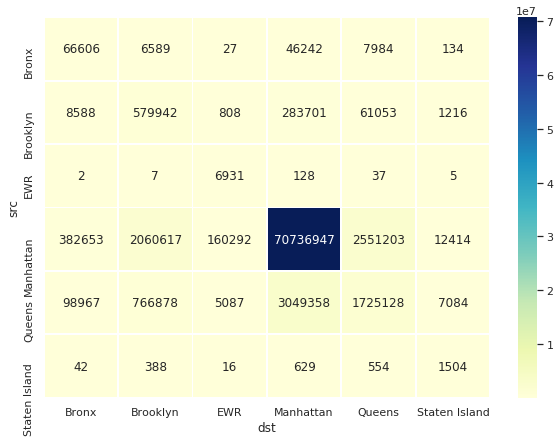

In [ ]:
sns.set()

borough = pd_df.pivot("src", "dst", "trip_count")
fig, ax = plt.subplots(figsize=(10,7))  
# Draw a heatmap with the numeric values in each cell
sns.heatmap(borough, annot=True, fmt="d", linewidths=1, cmap="YlGnBu", ax=ax)
plt.show()

Highest number of trips happen within Manhattan

### Traffic flow for each day of the week

In [ ]:
display(data.groupby("hour").mean("trip_speed_mph"))

hour,avg(trip_speed_mph)
12,10.992108020643117
22,14.416003638795026
1,17.159204358927074
13,11.402479266739116
6,17.529757548346183
16,11.47772015014022
3,18.015336132687963
20,13.24727511447989
5,21.924858293955925
19,12.046618616909276


Analyzing average trip speed on a hourly basis shows that 8 am to 6 pm are the busiest hours of the day with heavy traffic flow which leads to lower trip speed comparatively

In [ ]:
display(data.groupby("week_day").mean("trip_speed_mph"))

week_day,avg(trip_speed_mph)
Wednesday,12.050134002251731
Tuesday,12.174855752078905
Friday,12.143920654752478
Thursday,11.753926599556069
Saturday,12.965031681222069
Monday,13.290978423324319
Sunday,14.940524644310665


The trip speed on Thursdays is the lowest which might be because Thursday is the day with the highest number of trips. On the other hand, Sunday has comparatively higher trip speed which is again due to less trips on Sundays

#### Trip Distance vs Fare amount

In [ ]:
%sql select trip_distance, fare_amount from combo

trip_distance,fare_amount
1.5,7.0
2.6,14.0
1.3,6.5
3.7,13.5
2.1,10.0
2.8,15.0
0.7,5.5
8.7,34.5
6.3,21.5
2.7,13.0


The fare amount should ideally increase with trip distance. The above scatter plot between trip distance and fare amount shows that there is a linear relationship

In [ ]:
display(data.groupby("hour","week_day").mean("fare_amount"))

hour,week_day,avg(fare_amount)
4,Wednesday,17.149615885015074
9,Saturday,11.404548481104186
8,Thursday,12.5123187441702
7,Thursday,12.111833917868527
3,Monday,15.43855819303411
23,Sunday,15.81907539101309
0,Friday,14.190764341488292
3,Sunday,12.303996299012068
7,Wednesday,12.038323469917115
12,Wednesday,13.528249063530954


The above plot shows average fare amount on an hourly basis for each day of the week. It is observed the trips taken between midnight to early morning have a slightly higher average fare amount. This might be because of it being an odd time to travel.

In [ ]:
display(data.groupby("hour","week_day").mean("tip_amount"))

hour,week_day,avg(tip_amount)
4,Wednesday,2.323960786572547
8,Thursday,2.2127019922971805
9,Saturday,1.7823691883716877
7,Thursday,2.090797370847606
3,Monday,1.8332011634978362
23,Sunday,2.5084587726631478
0,Friday,2.460551934554191
3,Sunday,1.94626100779115
7,Wednesday,2.0828188615058734
12,Wednesday,2.173726844997629


The plot shows average tip amount on an hourly basis for each day of the week. It is observed that, people tend to give more tip odd hours whereas they give comparatively less during the bussiest hours of the day.

In [ ]:
display(trip_data.groupby("pick_up_borough").avg("fare_amount"))

pick_up_borough,avg(fare_amount)
Queens,35.12192395483728
EWR,81.16559497467891
Brooklyn,16.59206560316889
Staten Island,50.278844526566104
Manhattan,11.35442144930379
Bronx,21.98204876603973


In [ ]:
pd_df_fare = (trip_data.groupBy("pick_up_borough","drop_off_borough").avg("fare_amount")).toPandas()

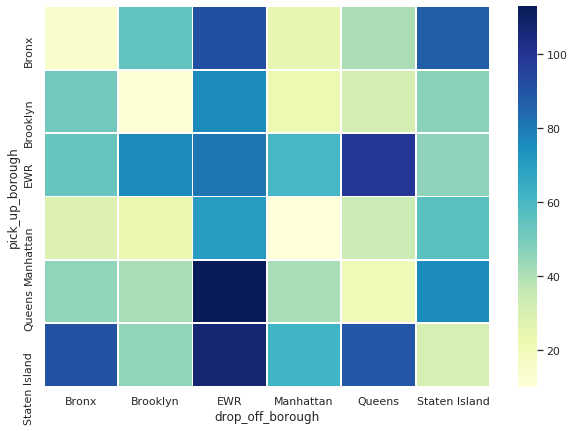

In [ ]:
import seaborn as sns
sns.set()

# Load the example flights dataset and conver to long-form
borough1 = pd_df_fare.pivot("pick_up_borough", "drop_off_borough", "avg(fare_amount)")
fig, ax = plt.subplots(figsize=(10,7))  
# Draw a heatmap with the numeric values in each cell
sns.heatmap(borough1, annot=True, fmt="d", linewidths=1, cmap="YlGnBu", ax=ax)
plt.show()

Average fare amount seems to be lowest in Manhattan (most frequent pickup and drop off borough) and highest in EWR. This might be beacause of a couple of reasons. Firstly, most trips starting from Manhattan also end in Manhattan and the distance travelled is less, hence low fare amount. Moreover, trip frequency to and from EWR is on a lower side and also because of Airport rides

In [ ]:
count_uess_df = (trip_data
 .where(trip_data.pick_up_zone == "Upper East Side South")
 .groupBy("drop_off_zone")
 .count()
 .orderBy(("count"), ascending=False)).toPandas()

In [ ]:
count_uess_df = count_uess_df[:10]

In [ ]:
avg_fare_uess_df = (trip_data
 .where(trip_data.pick_up_zone == "Upper East Side South")
 .groupBy("drop_off_zone")
 .avg("fare_amount")
 .orderBy(avg("fare_amount"), ascending=False)).toPandas()

In [ ]:
count_uess_df = count_uess_df.merge(avg_fare_uess_df, how="left", on="drop_off_zone")

In [ ]:
count_uess_df

,drop_off_zone,count,avg(fare_amount)
0,Upper East Side North,534995,6.528508
1,Upper East Side South,431414,5.687413
2,Midtown East,224440,7.082162
3,Midtown Center,218354,8.169844
4,Lenox Hill West,183160,5.771981
5,Lincoln Square East,146196,8.217562
6,Lenox Hill East,142139,6.760174
7,Yorkville West,139284,6.761395
8,Sutton Place/Turtle Bay North,103493,7.577196
9,Midtown North,103328,7.487157


In [ ]:
count_uess_df["src"] = "Upper East Side South"
count_uess_df.rename(columns={"drop_off_zone": "dst"}, inplace=True)
count_uess_df["count"] = count_uess_df["count"].astype("object")
count_uess_df["count"] = count_uess_df["count"].astype("int")

In [ ]:
count_uess_df

,dst,count,avg(fare_amount),src
0,Upper East Side North,534995,6.528508,Upper East Side South
1,Upper East Side South,431414,5.687413,Upper East Side South
2,Midtown East,224440,7.082162,Upper East Side South
3,Midtown Center,218354,8.169844,Upper East Side South
4,Lenox Hill West,183160,5.771981,Upper East Side South
5,Lincoln Square East,146196,8.217562,Upper East Side South
6,Lenox Hill East,142139,6.760174,Upper East Side South
7,Yorkville West,139284,6.761395,Upper East Side South
8,Sutton Place/Turtle Bay North,103493,7.577196,Upper East Side South
9,Midtown North,103328,7.487157,Upper East Side South


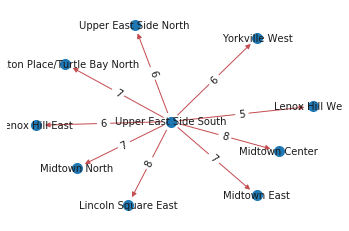

In [ ]:
G = nx.DiGraph()
for index , row in count_uess_df.iterrows():
    G.add_edge(count_uess_df.src[index], count_uess_df.dst[index], weight = int(count_uess_df["avg(fare_amount)"][index]))
labels = nx.get_edge_attributes(G,'weight')

pos = nx.spring_layout(G)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G, pos, node_size=100)

# edges
nx.draw_networkx_edges(G, pos, width=1, edge_color='r')
#nx.draw_networkx_edges(G, pos, edgelist=esmall, width=2, alpha=0.4, edge_color='b')

# labels
nx.draw_networkx_labels(G, pos, font_size=10, font_family='sans-serif')
nx.draw_networkx_edge_labels(G,pos,edge_labels=labels)
plt.axis('off')
fig = plt.figure(figsize=(20,20))
plt.show()
 

The network shows trips from Upper east side south to top 10 destinations with their average fare. Trips from Upper East Side South toLexox Hill We has the least average fare amount.

#### Analyzing the Rate Codes

In [ ]:
display(trip_data.groupby('RatecodeID').avg('trip_distance', 'fare_amount'))

RatecodeID,avg(trip_distance),avg(fare_amount)
1,2.5432447077533578,11.768967168690915
6,1.058355257278635,36.65438540362377
3,16.675858007381468,66.70519650147787
5,5.789047731701356,43.35425960163157
4,11.830550611357086,52.08159677564754
2,16.797707306248064,51.993368277715135
99,1.528289315818266,13.425530150033472


Rate codes 2 and 3 are to JFK and Newark Airports so it is not too surprising that there is extra charge. 

Rate code 4 is trips to Nassau County or Westchester County which have a median trip distance slightly lower than for rate codes 2 and 3. This is because trips to these counties are charged at the standard city rate within New York City and at twice the metered rate while in Westchester or Nassau County. 

Rate code 5 is for negotiated fares and the median trip distance for fares with this rate code is much less which suggests that cab driver’s are much better off when fares are negotiated.

##Linear regression to predict trip fare

This model can be used in application for taxi providers to give users and drivers an estimate on ride fares.

In [ ]:
query = """
SELECT
    c.fare_amount,
    c.pick_up_borough,
    c.pick_up_zone,
    c.dayofweek,
    c.hour,
    c.trip_distance,
    c.trip_duration_min
FROM 
    combo c    
"""
model_df = spark.sql(query)

In [ ]:
model_df.show()

In [ ]:
categoricalColumns = ["pick_up_borough", "pick_up_zone", 'drop_off_borough', "drop_off_zone" ,"dayofweek", "hour"]
stages = []
for categoricalCol in categoricalColumns:
    stringIndexer = StringIndexer(inputCol=categoricalCol, outputCol=categoricalCol + "Index").setHandleInvalid("keep")
    # Use OneHotEncoder to convert categorical variables into binary SparseVectors
    if LooseVersion(pyspark.__version__) < LooseVersion("3.0"):
        from pyspark.ml.feature import OneHotEncoderEstimator
        encoder = OneHotEncoderEstimator(inputCols=[stringIndexer.getOutputCol()], outputCols=[categoricalCol + "classVec"])
    else:
        from pyspark.ml.feature import OneHotEncoder
        encoder = OneHotEncoder(inputCols=[stringIndexer.getOutputCol()], outputCols=[categoricalCol + "classVec"])
    stages += [stringIndexer, encoder]

In [ ]:
# Transform all features into a vector using VectorAssembler
numericCols = ["trip_duration_min", "trip_distance"]
assemblerInputs = [c + "classVec" for c in categoricalColumns] + numericCols
assembler = VectorAssembler(inputCols=assemblerInputs, outputCol="features").setHandleInvalid("keep")
stages += [assembler]

In [ ]:

lr = LinearRegression(labelCol="fare_amount")
stages += [lr]
pipeline = Pipeline(stages=stages)

train, test = trip_data.randomSplit([0.75, 0.25]) 

model = pipeline.fit(train)

predictions = model.transform(test)

eval = RegressionEvaluator(labelCol="fare_amount", predictionCol="prediction")

print('RMSE:', eval.evaluate(predictions, {eval.metricName: "rmse"}))
print('R-squared:', eval.evaluate(predictions, {eval.metricName: "r2"}))

RMSE: 5.057048132828831
R-squared: 0.8068071492364245

Having a predicted fare amount helps in reducing loss of income.